In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split,StratifiedKFold,cross_val_score
from sklearn.linear_model import LinearRegression,LogisticRegression,HuberRegressor,PassiveAggressiveRegressor,SGDClassifier
from sklearn import metrics
import numpy as np
from sklearn.ensemble import ExtraTreesRegressor,RandomForestRegressor,RandomForestClassifier
from xgboost import XGBRegressor,XGBClassifier
from sklearn.ensemble import GradientBoostingRegressor,VotingRegressor
from sklearn.model_selection import KFold,cross_validate
from sklearn.tree import DecisionTreeClassifier
import time
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
from IPython.display import Image
import matplotlib.pyplot as plt
from matplotlib import pyplot

## Method-1 
(Data directly taken from preprocessed dataset)

### Reading Data

In [2]:
data=pd.read_csv('/Users/shwethailango/Documents/Work/Solarillion/Flight_delay_pred/Data/data_processed/flight_delay_pred.csv')
data2=data.drop(columns=['Unnamed: 0','DayofMonth.1'],axis=1)


In [3]:
# Filtering delayed data
df1=data2[data2.ArrDel15==1]


In [5]:
df1.shape

(388058, 29)

### Assigning Dependent and Independant variables

In [6]:
f_imp=['DepDelayMinutes', 'DepTime', 'CRSDepTime', 'time', 'DestAirportID', 'OriginAirportID','Year',
       'weatherCode', 'pressure', 'winddirDegree', 'WindGustKmph','cloudcover','precipMM',
       'windspeedKmph', 'WindChillF', 'DewPointF', 'humidity','tempF','WindChillF','DayofMonth','Quarter','Month']

In [7]:
x=np.array(df1[f_imp])
y=np.array(df1['ArrDelayMinutes'])

### Splitting test and train datasets

In [8]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,random_state=42,test_size=0.20)

### Function for training Regression Models 

In [9]:
def train_model(x,y,model):
    xtrain,xtest,ytrain,ytest=train_test_split(x,y,random_state=42,test_size=0.33)
    model.fit(xtrain,ytrain)
    ypred=model.predict(xtest)
    return ypred,ytest
    

### 1.LinearRegression

In [20]:
model=LinearRegression()
yp1,ytest1=train_model(x,y,LinearRegression())
print("Mean Abs Error: ",metrics.mean_absolute_error(ytest1, yp1))
print("Mean Sqrd Erro: ",metrics.mean_squared_error(ytest1,yp1))
print("R2 score: ",metrics.r2_score(ytest1,yp1))
print("Intercept: ",model.intercept_)
print("Coef: \n",model.coef_)

Mean Abs Error:  14.646499616083775
Mean Sqrd Erro:  400.4738842094675
R2 score:  0.9213944337515717
Intercept:  [136.88367938]
Coef: 
 [[ 9.18852200e-01 -8.45245644e-04 -4.45238207e-03  1.29637730e-03
   5.90546325e-04 -1.84603591e-04  1.31044393e-02 -1.27164485e-01
  -3.21430755e-03  3.82682133e-02  1.25081472e-02 -9.44438365e-02
   4.30442939e-02 -2.10169214e-02  1.76951300e-01 -9.44438365e-02
  -1.23146689e-02 -3.28572380e-01  1.05587931e-01]]


### 2.ExtraTreesRegressor

In [26]:
yp2,ytest2=train_model(x,y,ExtraTreesRegressor())
print("Mean Abs Error: ",metrics.mean_absolute_error(ytest2, yp2))
print("Mean Sqrd Error: ",metrics.mean_squared_error(ytest2,yp2))
print("R2 score: ",metrics.r2_score(ytest2,yp2))

Mean Abs Error:  12.034801108855225
Mean Sqrd Error:  294.4026007742464
R2 score:  0.942214251537148


### 3.GradientBoostingRegressor

In [11]:
yp4,ytest4=train_model(x,y,GradientBoostingRegressor())
print("Mean Abs Error: ",metrics.mean_absolute_error(ytest4, yp4))
print("Mean Sqrd Error: ",metrics.mean_squared_error(ytest4,yp4))
print("R2 score: ",metrics.r2_score(ytest4,yp4))

Mean Abs Error: 11.763556128194695
Mean Sqrd Error: 287.9809192000921
R2 score: 0.9436196322156787


### 4.RandomForestRegressor

In [12]:
yp3,ytest3=train_model(x,y,RandomForestRegressor())
print("Mean Abs Error: ",metrics.mean_absolute_error(ytest3, yp3))
print("Mean Sqrd Error: ",metrics.mean_squared_error(ytest3,yp3))
print("R2 score: ",metrics.r2_score(ytest3,yp3))

Mean Abs Error: 11.908424364881046
Mean Sqrd Error: 291.9809192000921
R2 score: 0.9429196352550166


### -------

### Method-2 
(Data taken from Classifier Model (classification.ipynb))

#### Reading Data and modelling with best classifier

In [7]:
df2=data.drop(columns=['FlightDate', 'airport','Unnamed: 0','DayofMonth.1'],axis=1)

In [8]:
df2.shape

(1851436, 27)

Splitting test and train sets

In [9]:
x_=df2
y_=df2['ArrDel15']

In [10]:
xtrain,xtest,ytrain,ytest=train_test_split(x_,y_,random_state=42,test_size=0.20)

Extracting test datasets into a new dataframe-df01

In [11]:
df01=pd.DataFrame(xtest)

In [12]:
df01.head()

,time,DayofMonth,Quarter,Month,Year,OriginAirportID,CRSDepTime,DepTime,DepDelayMinutes,DepDel15,...,cloudcover,tempF,WindChillF,precipMM,DewPointF,humidity,windspeedKmph,visibility,WindGustKmph,winddirDegree
1778209,2000,6,2,6,2016,11618,1935,1929.0,0.0,0.0,...,52,81,80,0.0,59,49,15,10,22,218
737512,1400,10,2,4,2017,12892,1345,1339.0,0.0,0.0,...,0,64,66,0.0,46,49,18,10,20,220
36012,1700,20,4,12,2017,13930,1715,1715.0,0.0,0.0,...,33,30,24,0.0,22,70,14,10,15,54
1079740,1100,31,1,3,2016,11292,1105,1143.0,38.0,1.0,...,100,37,29,1.1,31,79,21,7,25,110
1093872,800,20,1,3,2016,14107,810,844.0,34.0,1.0,...,7,66,67,0.0,29,31,7,10,12,71


In [13]:
fimp=['DepDelayMinutes', 'DepTime', 'CRSDepTime', 'time', 'DestAirportID', 'OriginAirportID','DayofMonth','Quarter','Month'
       ,'weatherCode', 'pressure', 'winddirDegree', 'WindGustKmph',
       'windspeedKmph', 'WindChillF', 'DewPointF', 'humidity','tempF']

Dependant and independant variable(only selected features(fimp) are used taken) 

In [14]:
xtrain1,xtest1=xtrain[fimp],xtest[fimp]

### XGBoost-RandomUndersampling(choosing best classifier)

In [ ]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)
x_us, y_us = rus.fit_resample(xtrain1,ytrain1)

In [8]:
rfc=XGBClassifier()
rfc.fit(x_us,y_us)
ypred5=rfc.predict(xtest1)


Assigning predicted value(delay or not) to the dataset as new column

In [127]:
df01['delay01']=rfc.predict(xtest1)

In [128]:
df01.shape

(370288, 28)

Extracting only delayed data (delay=1) to predict the Arrival delay period 

In [129]:
df02=df01[df01.delay01==1]

In [130]:
df02.shape

(66521, 28)

In [133]:
df02.to_csv('/Users/shwethailango/Documents/Work/Solarillion/Flight_delay_pred/Data/Flight_Delay_pred/reg/filtered02.csv')

####  Assigning target variable and Splitting test and train datasets

In [23]:
x1=np.array(df02[f_imp])
y1=np.array(df02['ArrDelayMinutes'])

In [24]:
x1_train,x1_test,y1_train,y1_test=train_test_split(x1,y1,random_state=42,test_size=0.20)

In [25]:
x1_train.shape

(53216, 22)

In [ ]:
#df3.to_csv('/Users/shwethailango/Documents/Work/Solarillion/Flight_delay_pred/Data/Flight_Delay_pred/reg/filtered.csv')

###  Training model, prediction and cross-validation

##### List of Regressors 
(new models can be included)


In [26]:
def regressors():
    models=[]
    models.append(('LR'   , LinearRegression()))
    models.append(('ETR'  , ExtraTreesRegressor()))
    models.append(('GBR'  , GradientBoostingRegressor()))
    models.append(('RFR' , RandomForestRegressor()))
    return models

##### Cross_val
(Modeling and predicting with same set of data may not be a good measure for performance metrics, so cross validation is done to check whether accuracy is convinving or not )
Here it is done using kfold


In [27]:
SEED = 7
np.random.seed(SEED)

def cross_val1(x_train, y_train,models):
    # Test options and evaluation metric
    num_folds = 10
    scoring = ['neg_root_mean_squared_error','neg_mean_absolute_error','r2']

    results = []
    regs = []
    for i,j in models:
        kfold = StratifiedKFold(n_splits=num_folds, random_state=SEED)
        cv_results = cross_validate(j, x_train, y_train, cv=kfold, scoring=scoring)
        results.append(cv_results['test_r2'])
        regs.append(i)
        msg = "%s->\n RMSE: %f , MAE: %f " % (i, abs(cv_results['test_neg_root_mean_squared_error'].mean()),
                                          abs(cv_results['test_neg_mean_absolute_error'].mean()))
        print(msg)
    
        
    return regs,results

##### Visualization with box plot
(Box plot is used to visualize the distribution of values(cv_results) of "cross validated scores".<br> 
 It gives 5 number summary: minimum,25th percentile,median,75th percentile,maximum)

In [28]:
class PlotBoxR(object):
    
    
    def __Trace(self,nameOfFeature,value): 
    
        trace = go.Box(
            y=value,
            name = nameOfFeature,
            marker = dict(
                color = 'rgb(0, 128, 128)',
            )
        )
        return trace

    def PlotResult(self,regs,results):
        
        data = []

        for i in range(len(regs)):
            data.append(self.__Trace(regs[i],results[i]))


        py.iplot(data)

##### Implementation

In [223]:
models = regressors()
names,results = cross_val1(x1_train, y1_train,models)


/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:297: FutureWarning:

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.

/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:672: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.



LR->
 RMSE: 18.509850 , MAE: 13.108775 


/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:297: FutureWarning:

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.

/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:672: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.



ETR->
 RMSE: 18.860143 , MAE: 13.361767 


/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:297: FutureWarning:

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.

/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:672: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.



GBR->
 RMSE: 18.415498 , MAE: 12.817938 


/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:297: FutureWarning:

Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.

/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/model_selection/_split.py:672: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=10.



RFR->
 RMSE: 18.769329 , MAE: 13.213191 


### Hyperparameter tuning: Grid Search CV for gradient boosting regressor

In [36]:
num_estimators = [500,1000]
learn_rates = [0.02, 0.05]
max_depths = [1, 2]
min_samples_leaf = [5,10]
min_samples_split = [5,10]

param_grid = {'n_estimators': num_estimators,
              'learning_rate': learn_rates,
              'max_depth': max_depths,
              'min_samples_leaf': min_samples_leaf,
              'min_samples_split': min_samples_split}

grid_search = GridSearchCV(GradientBoostingRegressor(loss='huber'),
                           param_grid, cv=3, return_train_score=True)
grid_search.fit(x1_train, y1_train)

GridSearchCV(cv=3, estimator=GradientBoostingRegressor(loss='huber'),
             param_grid={'learning_rate': [0.02, 0.05], 'max_depth': [1, 2],
                         'min_samples_leaf': [5, 10],
                         'min_samples_split': [5, 10],
                         'n_estimators': [500, 1000]},
             return_train_score=True)

In [37]:
grid_search.best_params_

{'learning_rate': 0.05,
 'max_depth': 2,
 'min_samples_leaf': 5,
 'min_samples_split': 10,
 'n_estimators': 1000}

In [1]:
grid_search.score(x1_train, y1_train)

0.9600501371936371


In [237]:
PlotBoxR().PlotResult(names,results)

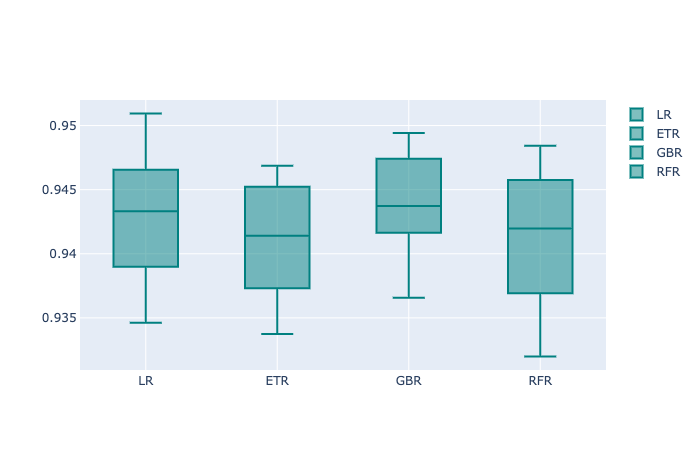

In [143]:
Image(filename='/Users/shwethailango/Downloads/newplot (2).png') 

#####  Voting Regressor

In [145]:
r1 = GradientBoostingRegressor()
r2 = HuberRegressor(epsilon=1.65)
r3 = PassiveAggressiveRegressor(random_state=0)

In [146]:
vreg = VotingRegressor([('grb', r1), ('hub', r2),('par',r3)])

In [147]:
yp_f = vreg.fit(x1_train, y1_train).predict(x1_test)

/Users/shwethailango/anaconda/lib/python3.6/site-packages/sklearn/linear_model/_huber.py:296: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html



In [148]:
print("Mean Abs Error: ",metrics.mean_absolute_error(y1_test, yp_f))
print("Mean Sqrd Error: ",metrics.mean_squared_error(y1_test,yp_f))
print("R2 score: ",metrics.r2_score(y1_test,yp_f))

Mean Abs Error:  14.066285318813717
Mean Sqrd Error:  366.30678928530267
R2 score:  0.9411515933297818


### Testing Regressor with different intervals of ArrDelMinutes with GradientBoostRegressor


In [5]:
df1=df1.sort_values(by='ArrDelayMinutes')

In [6]:
df1.shape

(388058, 29)

In [5]:
df1.head()

,FlightDate,airport,time,DayofMonth,Quarter,Month,Year,OriginAirportID,CRSDepTime,DepTime,...,cloudcover,tempF,WindChillF,precipMM,DewPointF,humidity,windspeedKmph,visibility,WindGustKmph,winddirDegree
528543,2017-11-16,JFK,1700,16,4,11,2017,12478,1630,1626.0,...,7,49,43,0.0,41,73,31,10,41,273
530650,2017-11-16,DFW,1100,16,4,11,2017,11298,1050,1121.0,...,100,62,62,0.0,58,86,10,8,13,75
530487,2017-11-05,MIA,2100,5,4,11,2017,13303,2120,2118.0,...,36,77,77,0.0,69,77,8,10,10,154
530346,2017-11-14,CLT,1800,14,4,11,2017,11057,1809,1805.0,...,31,49,47,0.0,40,70,8,10,11,41
530257,2017-11-03,CLT,1800,3,4,11,2017,11057,1825,1819.0,...,0,79,79,0.0,63,59,6,10,8,294


##### To know about the distribution of DelayMinutes for splitting into various intervals

In [6]:
fk=pd.DataFrame(df1.ArrDelayMinutes.value_counts())

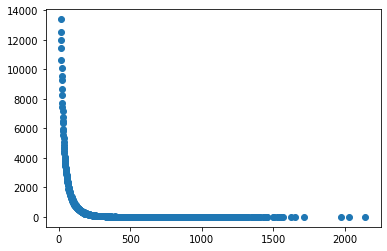

In [9]:
plt.scatter(fk.index,fk['ArrDelayMinutes'])


Text(0, 0.5, 'Density')

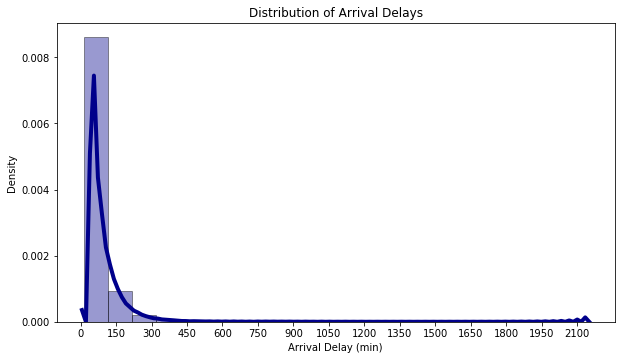

In [13]:
plt.figure(figsize=(10,5.5))

g=sns.distplot(df1['ArrDelayMinutes'], hist=True, kde=True, 
             bins=int(2142/100), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})


g = (g.set(xticks=np.arange(0,2142,150)))

plt.title('Distribution of Arrival Delays')
plt.xlabel('Arrival Delay (min)')
plt.ylabel('Density')

##### Splitting dataframe according to intervals

In [11]:
a1=df1[df1['ArrDelayMinutes'].between(0,100)]
a2=df1[df1['ArrDelayMinutes'].between(100,300)]
a3=df1[df1['ArrDelayMinutes'].between(300,600)]
a4=df1[df1['ArrDelayMinutes'].between(600,1000)]
a5=df1[df1['ArrDelayMinutes'].between(1000,2200)]

li=[a1,a2,a3,a4,a5]

##### Implementing into Regressor and validation 

In [21]:
for i in li:
    #dependent and indepandant set
    xx=np.array(i[f_imp])
    yy=np.array(i['ArrDelayMinutes'])
    
    #train model
    Yp,Yt=train_model(xx,yy,GradientBoostingRegressor())
    
    #Performance metrics
    m="%d to %d" % (min(i['ArrDelayMinutes']),max(i['ArrDelayMinutes']))
    print(m,"\r")
    print("MAE: ",metrics.mean_absolute_error(Yt, Yp))
    print("RMSE: ",(metrics.mean_squared_error(Yt,Yp))**0.5)
    print("R2 score: ",metrics.r2_score(Yt,Yp))
    print("\n")

15 to 100
MAE:  9.911364643480143 
RMSE:  13.284030210980797
R2 score:  0.6431453175751477


100 to 300 
MAE:  13.534968062997102
RMSE:  18.015982286536715
R2 score:  0.8467733044739754


300 to 600 
MAE:  15.243433688906014
RMSE:  21.229207647337516
R2 score:  0.9040909360047225


600 to 1000 
MAE:  14.870188500834477
RMSE:  19.299278245240622
R2 score:  0.96499963566047


1000 to 2142 
MAE:  107.675914733095278
RMSE:  114.875056778847497
R2 score:  0.9763357908218471




### Regression Analysis: box plot for distribution of actual delay minutes

In [4]:
import numpy as np
np.random.seed(1)



fig = go.Figure()
fig.add_trace(go.Box(x=df1['ArrDelayMinutes'],boxpoints=False,name='ArrDelMins'))
                                                                
fig.update_layout(
    autosize=False,
    width=1100,
    height=400,
    
    
)

fig.show()

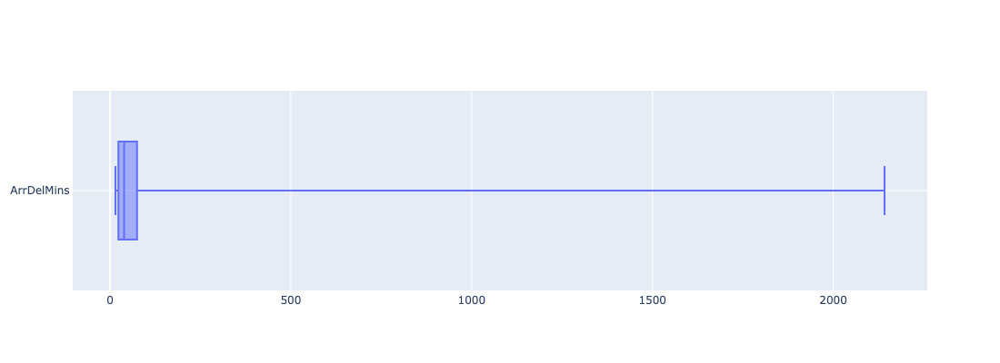

In [7]:
Image(filename='/Users/shwethailango/Downloads/newplot (1).png') 

### Visualising outliners

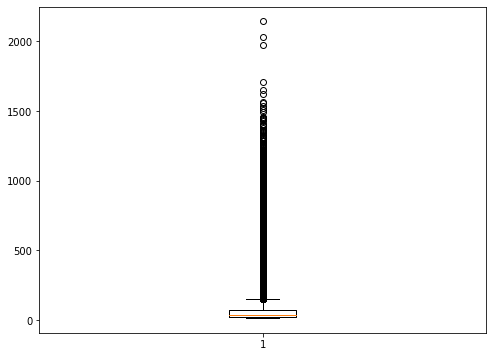

In [8]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.boxplot(df1['ArrDelayMinutes'],showfliers=True)
plt.show()